# Air Quality Prediction UCI

## By Johan E. Cala Torra & Mario E. Hurtado Guzman

## Data Set Information:

The dataset contains 9358 instances of hourly averaged responses from an array of 5 metal oxide chemical sensors embedded in an Air Quality Chemical Multisensor Device. The device was located on the field in a significantly polluted area, at road level,within an Italian city. Data were recorded from March 2004 to February 2005 (one year)representing the longest freely available recordings of on field deployed air quality chemical sensor devices responses. Ground Truth hourly averaged concentrations for CO, Non Metanic Hydrocarbons, Benzene, Total Nitrogen Oxides (NOx) and Nitrogen Dioxide (NO2) and were provided by a co-located reference certified analyzer. Evidences of cross-sensitivities as well as both concept and sensor drifts are present as described in De Vito et al., Sens. And Act. B, Vol. 129,2,2008 (citation required) eventually affecting sensors concentration estimation capabilities. Missing values are tagged with -200 value.
* Download dataset [here](https://archive.ics.uci.edu/ml/machine-learning-databases/00360/AirQualityUCI.zip)

## Attribute Information:

**0** Date (DD/MM/YYYY)  
**1** Time (HH.MM.SS)  
**2** True hourly averaged concentration CO in mg/m^3 (reference analyzer)  
**3** PT08.S1 (tin oxide) hourly averaged sensor response (nominally CO targeted)  
**4** True hourly averaged overall Non Metanic HydroCarbons concentration in microg/m^3 (reference analyzer)  
**5** True hourly averaged Benzene concentration in microg/m^3 (reference analyzer)  
**6** PT08.S2 (titania) hourly averaged sensor response (nominally NMHC targeted)  
**7** True hourly averaged NOx concentration in ppb (reference analyzer)  
**8** PT08.S3 (tungsten oxide) hourly averaged sensor response (nominally NOx targeted)  
**9** True hourly averaged NO2 concentration in microg/m^3 (reference analyzer)  
**10** PT08.S4 (tungsten oxide) hourly averaged sensor response (nominally NO2 targeted)  
**11** PT08.S5 (indium oxide) hourly averaged sensor response (nominally O3 targeted)  
**12** Temperature in Â°C  
**13** Relative Humidity (%)  
**14** AH Absolute Humidity  

## Importing  libraries

In [2]:
# Import libraries 
import statistics
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score


## Loading the dataset

In [3]:
Data = pd.read_excel('AirQualityUCI.xlsx')

## About the dataset

In [4]:
Data.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,18:00:00,2.6,1360.00,150,11.881723,1045.50,166.0,1056.25,113.0,1692.00,1267.50,13.60,48.875001,0.757754
1,2004-03-10,19:00:00,2.0,1292.25,112,9.397165,954.75,103.0,1173.75,92.0,1558.75,972.25,13.30,47.700000,0.725487
2,2004-03-10,20:00:00,2.2,1402.00,88,8.997817,939.25,131.0,1140.00,114.0,1554.50,1074.00,11.90,53.975000,0.750239
3,2004-03-10,21:00:00,2.2,1375.50,80,9.228796,948.25,172.0,1092.00,122.0,1583.75,1203.25,11.00,60.000000,0.786713
4,2004-03-10,22:00:00,1.6,1272.25,51,6.518224,835.50,131.0,1205.00,116.0,1490.00,1110.00,11.15,59.575001,0.788794


In [5]:
Data.shape

(9357, 15)

In [6]:
Data.describe()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
count,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000
mean,-34.207524,1048.869652,-159.090093,1.865576,894.475963,168.604200,794.872333,58.135898,1391.363266,974.951534,9.776600,39.483611,-6.837604
std,77.657170,329.817015,139.789093,41.380154,342.315902,257.424561,321.977031,126.931428,467.192382,456.922728,43.203438,51.215645,38.976670
min,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000
25%,0.600000,921.000000,-200.000000,4.004958,711.000000,50.000000,637.000000,53.000000,1184.750000,699.750000,10.950000,34.050000,0.692275
50%,1.500000,1052.500000,-200.000000,7.886653,894.500000,141.000000,794.250000,96.000000,1445.500000,942.000000,17.200000,48.550000,0.976823
75%,2.600000,1221.250000,-200.000000,13.636091,1104.750000,284.200000,960.250000,133.000000,1662.000000,1255.250000,24.075000,61.875000,1.296223
max,11.900000,2039.750000,1189.000000,63.741476,2214.000000,1479.000000,2682.750000,339.700000,2775.000000,2522.750000,44.600000,88.725000,2.231036


In [7]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9357 entries, 0 to 9356
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           9357 non-null   datetime64[ns]
 1   Time           9357 non-null   object        
 2   CO(GT)         9357 non-null   float64       
 3   PT08.S1(CO)    9357 non-null   float64       
 4   NMHC(GT)       9357 non-null   int64         
 5   C6H6(GT)       9357 non-null   float64       
 6   PT08.S2(NMHC)  9357 non-null   float64       
 7   NOx(GT)        9357 non-null   float64       
 8   PT08.S3(NOx)   9357 non-null   float64       
 9   NO2(GT)        9357 non-null   float64       
 10  PT08.S4(NO2)   9357 non-null   float64       
 11  PT08.S5(O3)    9357 non-null   float64       
 12  T              9357 non-null   float64       
 13  RH             9357 non-null   float64       
 14  AH             9357 non-null   float64       
dtypes: datetime64[ns](1),

# Data Pre Processing

In [8]:
Data.isnull().sum()

Date             0
Time             0
CO(GT)           0
PT08.S1(CO)      0
NMHC(GT)         0
C6H6(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
dtype: int64

In [9]:
Data.dtypes

Date             datetime64[ns]
Time                     object
CO(GT)                  float64
PT08.S1(CO)             float64
NMHC(GT)                  int64
C6H6(GT)                float64
PT08.S2(NMHC)           float64
NOx(GT)                 float64
PT08.S3(NOx)            float64
NO2(GT)                 float64
PT08.S4(NO2)            float64
PT08.S5(O3)             float64
T                       float64
RH                      float64
AH                      float64
dtype: object

In [10]:
Data['CO(GT)'].value_counts()

-200.0    1683
 1.0       305
 1.4       279
 1.6       275
 1.5       273
          ... 
 9.9         1
 7.6         1
 9.3         1
 7.0         1
 8.5         1
Name: CO(GT), Length: 97, dtype: int64

# Exploration

0       2.6
1       2.0
2       2.2
3       2.2
4       1.6
       ... 
9352    3.1
9353    2.4
9354    2.4
9355    2.1
9356    2.2
Name: CO(GT), Length: 9357, dtype: float64


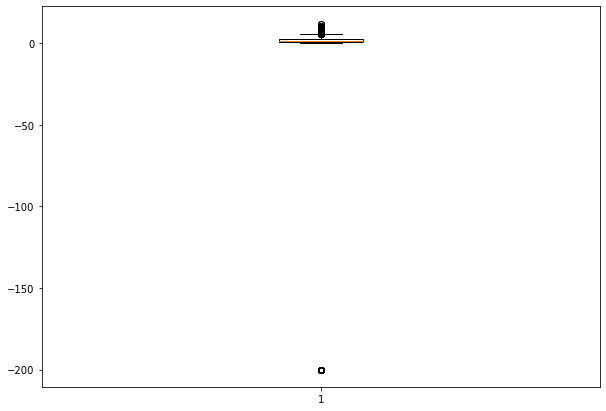

In [11]:
data =Data["CO(GT)"]
print(data)
fig = plt.figure(figsize =(10, 7)) 
plt.boxplot(data) 
plt.show() 

## Remove outliers

In [12]:
def IdentificarAtipicos(df, ft, valorAlfa):
    q1 = df[ft].quantile(0.25)
    q3 = df[ft].quantile(0.75)
    iqr = q3 - q1
    
    bigote_inferior = q1 - valorAlfa * iqr
    bigote_superior = q3 + valorAlfa * iqr
    
    ls = df.index[(df[ft]<bigote_inferior) | (df[ft] > bigote_superior)]
    return ls

def eliminar(df, index):
    index = sorted(set(index))
    df = df.drop(index)
    return df

index = IdentificarAtipicos(Data,"CO(GT)",1.5)


new_Data = eliminar(Data,index)

0       2.6
1       2.0
2       2.2
3       2.2
4       1.6
       ... 
9352    3.1
9353    2.4
9354    2.4
9355    2.1
9356    2.2
Name: CO(GT), Length: 7459, dtype: float64


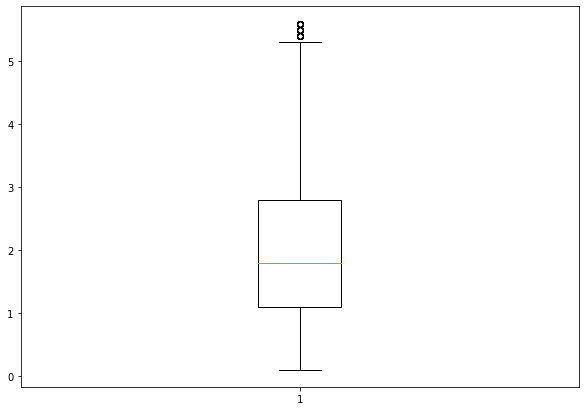

In [13]:
data =new_Data["CO(GT)"]
print(data)
fig = plt.figure(figsize =(10, 7)) 
plt.boxplot(data) 
plt.show() 

In [14]:
new_Data['CO(GT)'].value_counts()

1.0    305
1.4    279
1.6    275
1.5    273
1.1    262
0.7    260
1.7    258
1.3    253
0.8    251
0.9    248
1.2    247
0.6    244
1.9    232
2.0    221
2.1    218
0.5    217
2.2    202
2.3    191
1.8    185
2.4    172
2.6    161
0.4    160
2.5    152
2.7    149
2.8    136
3.1    118
2.9    118
3.0    114
3.4    113
3.3    109
3.2    103
0.3     98
3.5     96
3.6     85
4.0     77
3.8     74
3.9     68
4.1     65
4.3     60
3.7     60
4.2     56
4.6     50
4.5     47
4.4     46
0.2     45
5.0     38
4.8     37
4.9     35
4.7     34
0.1     33
5.6     27
5.1     24
5.5     22
5.4     21
5.2     20
5.3     15
Name: CO(GT), dtype: int64

In [15]:
print("Antes: ",Data.shape)
print("Despues: ",new_Data.shape)


Antes:  (9357, 15)
Despues:  (7459, 15)


## Replace all -200 by 0

In [16]:
new_Data_2 = Data.copy()
l=[]
for i in range(len(new_Data_2.columns)):
    f=new_Data_2.columns[i]
    count=0
    for j in range(len(new_Data_2[f])):
        if new_Data_2[f][j]==-200:
            count+=1
    l.append((f,count))

num=new_Data_2._get_numeric_data()
num[num<0]=0
new_Data_2

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,18:00:00,2.6,1360.00,150,11.881723,1045.50,166.0,1056.25,113.0,1692.00,1267.50,13.600,48.875001,0.757754
1,2004-03-10,19:00:00,2.0,1292.25,112,9.397165,954.75,103.0,1173.75,92.0,1558.75,972.25,13.300,47.700000,0.725487
2,2004-03-10,20:00:00,2.2,1402.00,88,8.997817,939.25,131.0,1140.00,114.0,1554.50,1074.00,11.900,53.975000,0.750239
3,2004-03-10,21:00:00,2.2,1375.50,80,9.228796,948.25,172.0,1092.00,122.0,1583.75,1203.25,11.000,60.000000,0.786713
4,2004-03-10,22:00:00,1.6,1272.25,51,6.518224,835.50,131.0,1205.00,116.0,1490.00,1110.00,11.150,59.575001,0.788794
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9352,2005-04-04,10:00:00,3.1,1314.25,0,13.529605,1101.25,471.7,538.50,189.8,1374.25,1728.50,21.850,29.250000,0.756824
9353,2005-04-04,11:00:00,2.4,1162.50,0,11.355157,1027.00,353.3,603.75,179.2,1263.50,1269.00,24.325,23.725000,0.711864
9354,2005-04-04,12:00:00,2.4,1142.00,0,12.374538,1062.50,293.0,603.25,174.7,1240.75,1092.00,26.900,18.350000,0.640649
9355,2005-04-04,13:00:00,2.1,1002.50,0,9.547187,960.50,234.5,701.50,155.7,1041.00,769.75,28.325,13.550000,0.513866


In [17]:
new_Data_2['CO(GT)'].value_counts()

0.0    1683
1.0     305
1.4     279
1.6     275
1.5     273
       ... 
9.9       1
7.6       1
9.3       1
7.0       1
8.5       1
Name: CO(GT), Length: 97, dtype: int64

## with outliers and -200

In [18]:
Data.corr()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
CO(GT),1.000000,0.041415,0.128351,-0.031377,0.029939,0.526450,-0.089981,0.671140,-0.073721,0.080316,-0.068952,-0.048231,-0.045892
PT08.S1(CO),0.041415,1.000000,0.170009,0.852659,0.933101,0.278029,0.086931,0.154058,0.845133,0.892436,0.754806,0.745344,0.764866
NMHC(GT),0.128351,0.170009,1.000000,0.037329,0.110097,-0.004413,0.048832,0.103345,0.162689,0.101189,-0.000008,0.008288,0.012500
C6H6(GT),-0.031377,0.852659,0.037329,1.000000,0.767401,-0.001163,0.512154,-0.010971,0.774649,0.641306,0.971370,0.925068,0.984556
PT08.S2(NMHC),0.029939,0.933101,0.110097,0.767401,1.000000,0.331331,-0.073748,0.176569,0.874761,0.909909,0.668984,0.585775,0.646535
NOx(GT),0.526450,0.278029,-0.004413,-0.001163,0.331331,1.000000,-0.436083,0.817138,0.035580,0.461916,-0.138457,-0.053008,-0.095841
PT08.S3(NOx),-0.089981,0.086931,0.048832,0.512154,-0.073748,-0.436083,1.000000,-0.256217,0.122672,-0.208935,0.588061,0.573513,0.621576
NO2(GT),0.671140,0.154058,0.103345,-0.010971,0.176569,0.817138,-0.256217,1.000000,-0.022092,0.253469,-0.084084,-0.081300,-0.060423
PT08.S4(NO2),-0.073721,0.845133,0.162689,0.774649,0.874761,0.035580,0.122672,-0.022092,1.000000,0.723670,0.755053,0.640685,0.691889
PT08.S5(O3),0.080316,0.892436,0.101189,0.641306,0.909909,0.461916,-0.208935,0.253469,0.723670,1.000000,0.503659,0.524922,0.519432


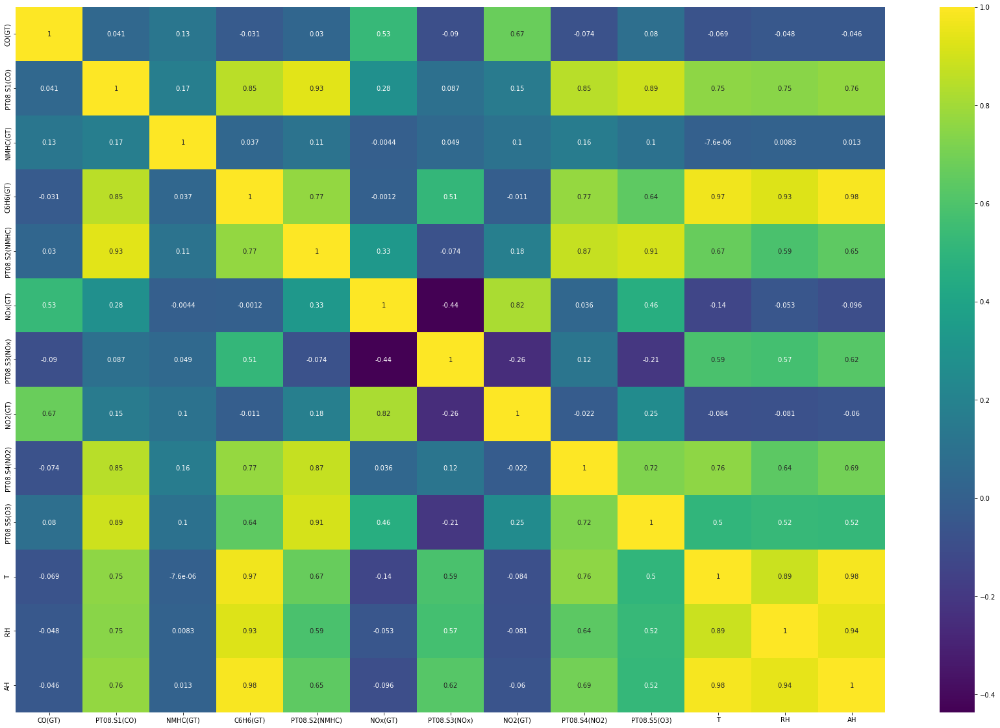

In [19]:
corrmat=Data.corr()
top_corr_feature=corrmat.index
plt.figure(figsize=(30,20))
# to plot heat map
g=sns.heatmap(Data[top_corr_feature].corr(),annot=True,cmap='viridis')

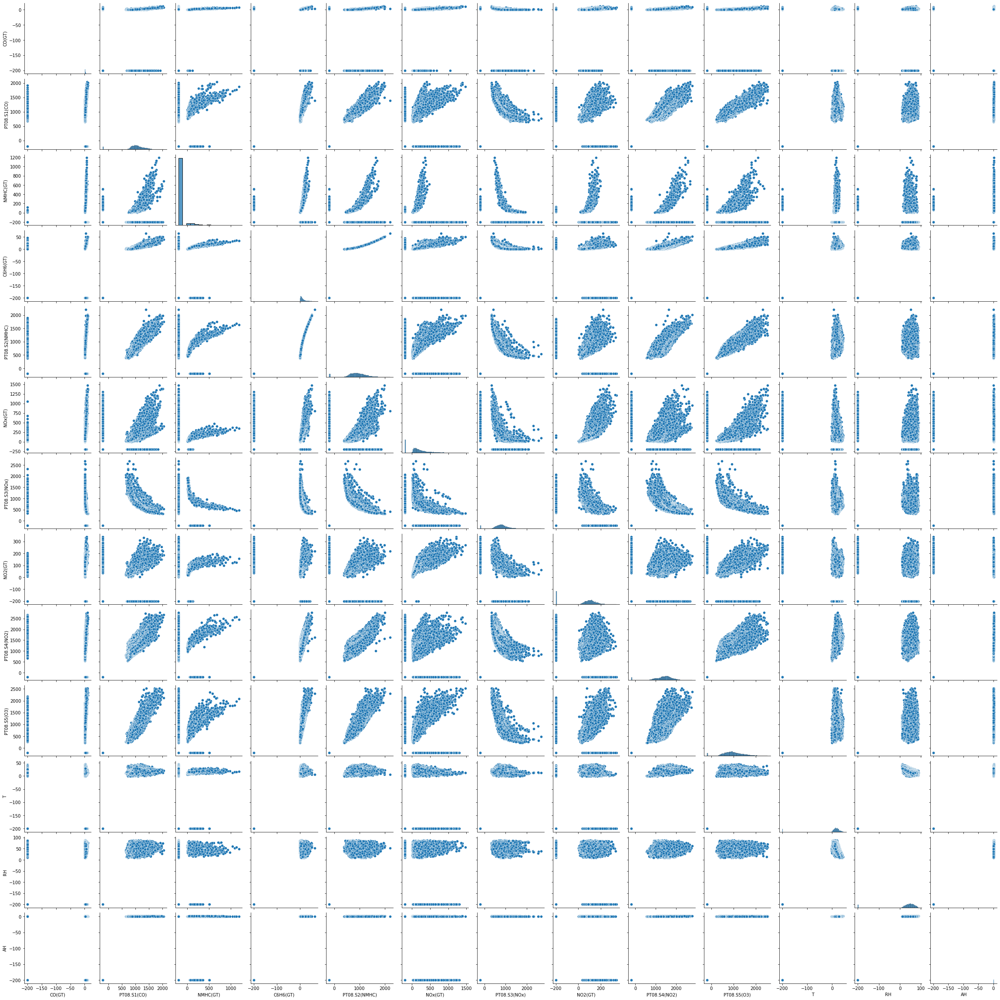

In [20]:
sns.pairplot(Data)

## now with -200 replaced by 0

In [21]:
new_Data_2.corr()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
CO(GT),1.000000,0.442803,0.249731,0.670790,0.533061,0.811449,-0.513070,0.723154,0.282080,0.586753,-0.079253,-0.018418,-0.092964
PT08.S1(CO),0.442803,1.000000,0.213250,0.786143,0.922093,0.356291,-0.075630,0.284508,0.823505,0.886880,0.300359,0.417492,0.403123
NMHC(GT),0.249731,0.213250,1.000000,0.198346,0.170037,-0.003611,-0.033366,0.099541,0.196691,0.155224,-0.025205,-0.020121,-0.071580
C6H6(GT),0.670790,0.786143,0.198346,1.000000,0.926265,0.543665,-0.457762,0.402581,0.734014,0.862751,0.275852,0.074847,0.261013
PT08.S2(NMHC),0.533061,0.922093,0.170037,0.926265,1.000000,0.419047,-0.240806,0.334108,0.855763,0.903060,0.400031,0.215377,0.393508
NOx(GT),0.811449,0.356291,-0.003611,0.543665,0.419047,1.000000,-0.514602,0.795888,0.068429,0.553223,-0.268778,0.079334,-0.210622
PT08.S3(NOx),-0.513070,-0.075630,-0.033366,-0.457762,-0.240806,-0.514602,1.000000,-0.440202,-0.002102,-0.352407,0.092534,0.223613,0.068493
NO2(GT),0.723154,0.284508,0.099541,0.402581,0.334108,0.795888,-0.440202,1.000000,0.010185,0.439057,-0.195749,-0.125245,-0.324221
PT08.S4(NO2),0.282080,0.823505,0.196691,0.734014,0.855763,0.068429,-0.002102,0.010185,1.000000,0.694715,0.641916,0.291896,0.719606
PT08.S5(O3),0.586753,0.886880,0.155224,0.862751,0.903060,0.553223,-0.352407,0.439057,0.694715,1.000000,0.149302,0.318989,0.259548


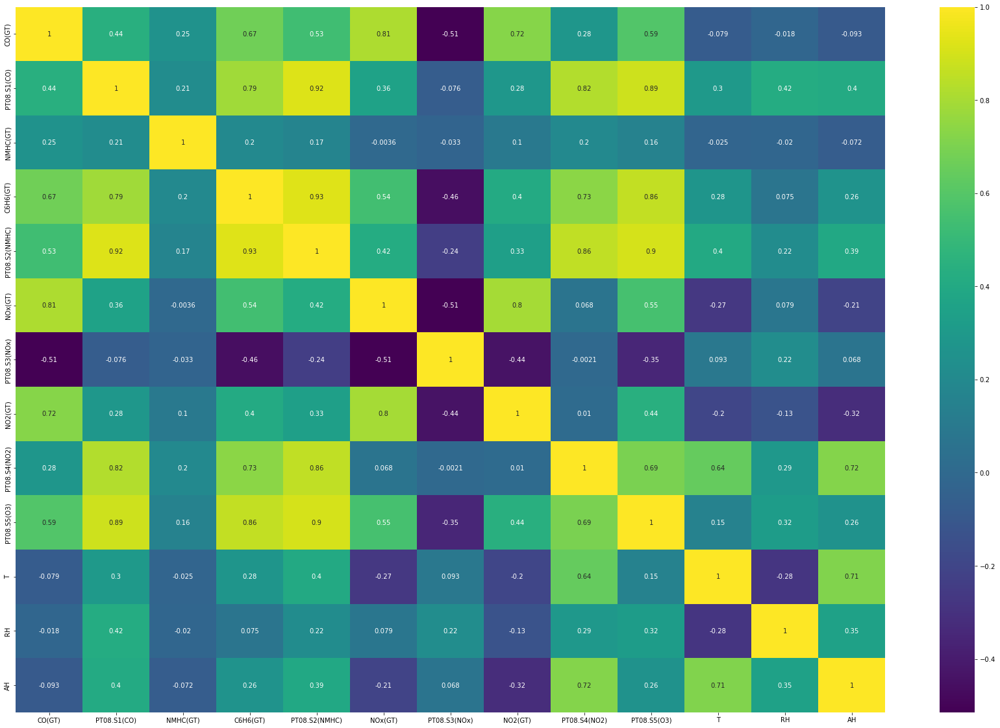

In [22]:
corrmat=new_Data_2.corr()
top_corr_feature=corrmat.index
plt.figure(figsize=(30,20))
# to plot heat map
g=sns.heatmap(new_Data_2[top_corr_feature].corr(),annot=True,cmap='viridis')

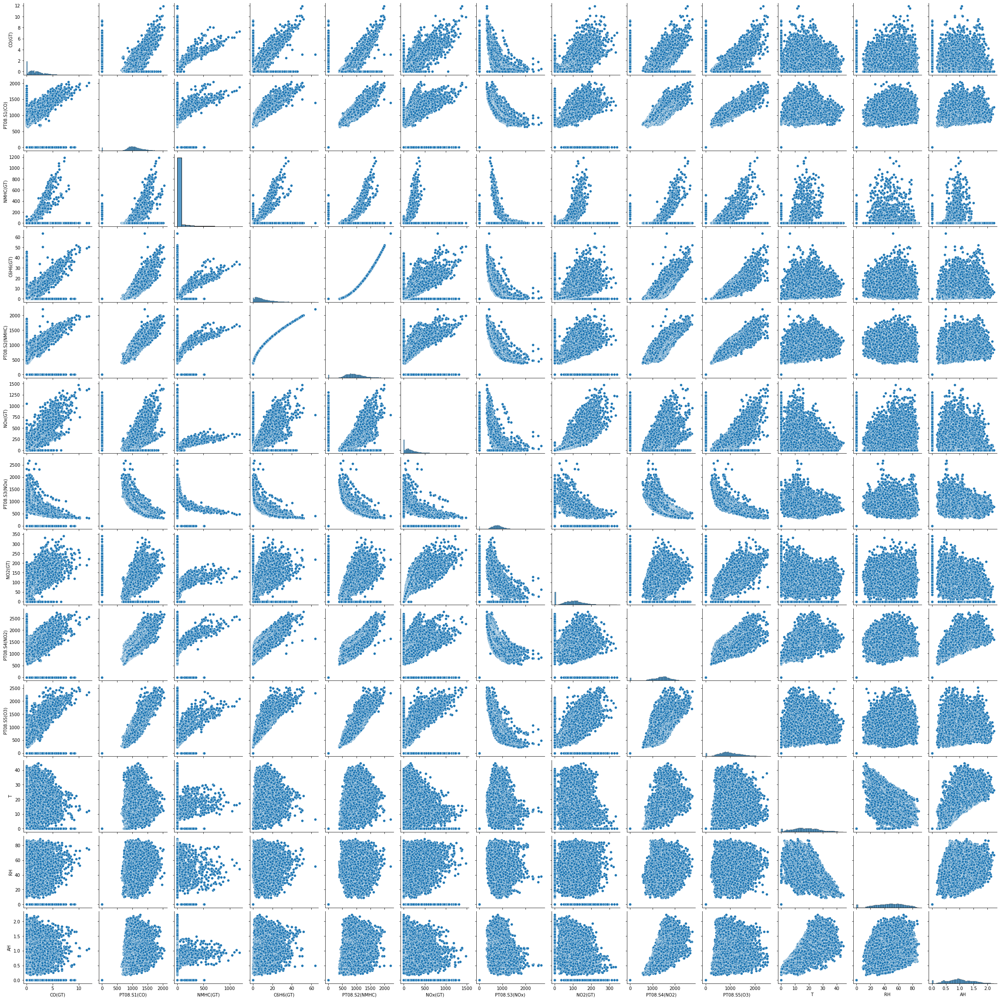

In [23]:
sns.pairplot(new_Data_2)

## without outliers

In [24]:
new_Data.corr()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
CO(GT),1.000000,0.465469,0.171658,0.077468,0.609293,0.720604,-0.567166,0.491003,0.369484,0.655557,-0.046974,-0.052451,-0.057570
PT08.S1(CO),0.465469,1.000000,0.168004,0.864751,0.928844,0.326368,0.157861,0.241099,0.832998,0.884263,0.785081,0.778130,0.795957
NMHC(GT),0.171658,0.168004,1.000000,0.036022,0.110372,-0.093131,0.066266,0.020003,0.176106,0.089505,0.003681,0.008123,0.013554
C6H6(GT),0.077468,0.864751,0.036022,1.000000,0.784427,0.022888,0.550701,0.020555,0.774532,0.647648,0.976097,0.930238,0.988788
PT08.S2(NMHC),0.609293,0.928844,0.110372,0.784427,1.000000,0.405848,0.003663,0.303905,0.868709,0.899750,0.708352,0.622465,0.685210
NOx(GT),0.720604,0.326368,-0.093131,0.022888,0.405848,1.000000,-0.504727,0.755757,0.064470,0.542117,-0.117073,-0.016703,-0.073486
PT08.S3(NOx),-0.567166,0.157861,0.066266,0.550701,0.003663,-0.504727,1.000000,-0.368905,0.187713,-0.153237,0.611275,0.586599,0.640452
NO2(GT),0.491003,0.241099,0.020003,0.020555,0.303905,0.755757,-0.368905,1.000000,0.053703,0.365233,-0.066103,-0.070767,-0.047469
PT08.S4(NO2),0.369484,0.832998,0.176106,0.774532,0.868709,0.064470,0.187713,0.053703,1.000000,0.702326,0.774495,0.654137,0.708119
PT08.S5(O3),0.655557,0.884263,0.089505,0.647648,0.899750,0.542117,-0.153237,0.365233,0.702326,1.000000,0.530853,0.555088,0.547409


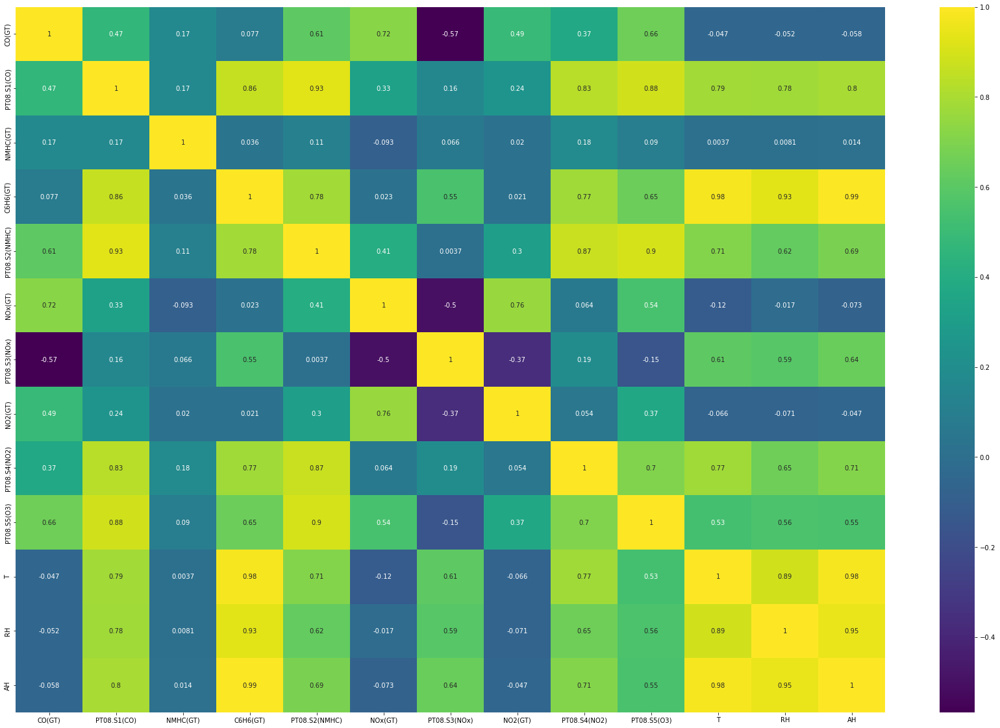

In [25]:
corrmat=new_Data.corr()
top_corr_feature=corrmat.index
plt.figure(figsize=(30,20))
# to plot heat map
g=sns.heatmap(new_Data[top_corr_feature].corr(),annot=True,cmap='viridis')

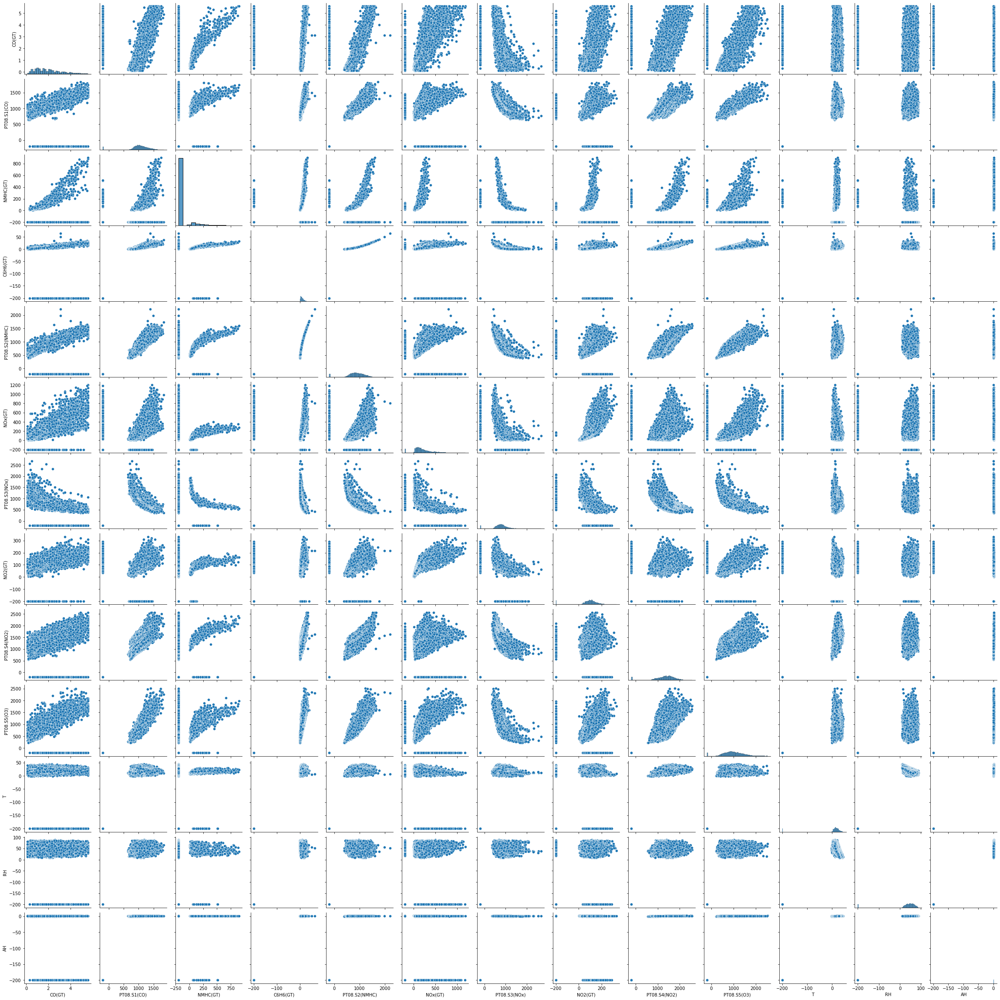

In [26]:
sns.pairplot(new_Data)

## Conclusions

**with the outliers and -200** the variables with the highest correlation are:  
NOX(GT)      
N02(GT)    

**with the outliers and replaced by 0** the variables with the highest correlation are:  
PT08.S1   
C6H6(GT)  
PT08.S2  
NOX(GT)    
N02(GT)  
PT08.S5(03)  

**without the outliers** the variables with the highest correlation are:   
PT08.S1  
PT08.S2  
NOX(GT)  
N02(GT)  
PT08.S4(N02)   
PT08.S5(03)    




# Prediction

**Column names**:  

CO(GT)                  
PT08.S1(CO)             
NMHC(GT)                  
C6H6(GT)                
PT08.S2(NMHC)           
NOx(GT)                 
PT08.S3(NOx)            
NO2(GT)                 
PT08.S4(NO2)            
PT08.S5(O3)             
T                       
RH                      
AH                      

## without the outliers

In [27]:
prome_1 = []
X=new_Data[['PT08.S1(CO)','PT08.S2(NMHC)','NOx(GT)','NO2(GT)','PT08.S4(NO2)','PT08.S5(O3)']]
Y=new_Data['CO(GT)']
model = LinearRegression()
for i in range(10):

    X_train, X_test, y_train, y_test = train_test_split(X, Y, train_size=0.5)
    model.fit(X = X_train, y = y_train)
    y_predict = model.predict(X = np.array(X_test))
    r2 = r2_score(y_true=y_test,y_pred=y_predict)
    prome_1.append(r2)

statistics.mean(prome_1)

0.6946389532470963

## with the outliers and -200

In [28]:
prome_2 = []
X=Data[['NOx(GT)','NO2(GT)']]
Y=Data['CO(GT)']
model = LinearRegression()
for i in range(10):
    
    X_train, X_test, y_train, y_test = train_test_split(X, Y, train_size=0.5)
    model.fit(X = X_train, y = y_train)
    y_predict = model.predict(X = np.array(X_test))
    r2 = r2_score(y_true=y_test,y_pred=y_predict)
    prome_2.append(r2)

statistics.mean(prome_2)

0.44949995353790234

## with the outliers and -200 replaced by 0

In [89]:
prome_3 = []
X=new_Data_2[['PT08.S1(CO)','C6H6(GT)','PT08.S2(NMHC)','NOx(GT)','NO2(GT)','PT08.S5(O3)']]
Y=new_Data_2['CO(GT)']
model = LinearRegression()
for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, Y, train_size=0.5)
    model.fit(X = X_train, y = y_train)
    y_predict = model.predict(X = np.array(X_test))
    r2 = r2_score(y_true=y_test,y_pred=y_predict)
    prome_3.append(r2)

statistics.mean(prome_3)

0.7743086288739519

# Transformations

The model chosen was with the outliers replacing the -200 by 0,i.e. the dataframe named **new_Data_2**

In [30]:
new_Data_2

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,18:00:00,2.6,1360.00,150,11.881723,1045.50,166.0,1056.25,113.0,1692.00,1267.50,13.600,48.875001,0.757754
1,2004-03-10,19:00:00,2.0,1292.25,112,9.397165,954.75,103.0,1173.75,92.0,1558.75,972.25,13.300,47.700000,0.725487
2,2004-03-10,20:00:00,2.2,1402.00,88,8.997817,939.25,131.0,1140.00,114.0,1554.50,1074.00,11.900,53.975000,0.750239
3,2004-03-10,21:00:00,2.2,1375.50,80,9.228796,948.25,172.0,1092.00,122.0,1583.75,1203.25,11.000,60.000000,0.786713
4,2004-03-10,22:00:00,1.6,1272.25,51,6.518224,835.50,131.0,1205.00,116.0,1490.00,1110.00,11.150,59.575001,0.788794
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9352,2005-04-04,10:00:00,3.1,1314.25,0,13.529605,1101.25,471.7,538.50,189.8,1374.25,1728.50,21.850,29.250000,0.756824
9353,2005-04-04,11:00:00,2.4,1162.50,0,11.355157,1027.00,353.3,603.75,179.2,1263.50,1269.00,24.325,23.725000,0.711864
9354,2005-04-04,12:00:00,2.4,1142.00,0,12.374538,1062.50,293.0,603.25,174.7,1240.75,1092.00,26.900,18.350000,0.640649
9355,2005-04-04,13:00:00,2.1,1002.50,0,9.547187,960.50,234.5,701.50,155.7,1041.00,769.75,28.325,13.550000,0.513866


In [73]:
df = pd.DataFrame()
df['1'] = None
df['2'] = None
df['3'] = None
df['4'] = None
df['5'] = None
df['6'] = None
df['7'] = None
df['9'] = new_Data_2['CO(GT)']

df['1'] = pow(new_Data_2['PT08.S1(CO)'],(1/2))
df['2'] = pow(new_Data_2['C6H6(GT)'], (1/2))
df['3']=  pow(new_Data_2['PT08.S2(NMHC)'], (1/2))
df['4']=  pow(new_Data_2['NOx(GT)'], (1/3))
df['5']=  pow(new_Data_2['PT08.S3(NOx)'], (1/2))
df['6']=  pow(new_Data_2['NO2(GT)'], (1/2))
df['7']=  pow(new_Data_2['PT08.S5(O3)'],(1/2))

prome_t = []
X=df[['1','2','3','4','5','6','7']]
Y=df['9']
model = LinearRegression()
for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, Y, train_size=0.5)
    model.fit(X = X_train, y = y_train)
    y_predict = model.predict(X = np.array(X_test))
    r2 = r2_score(y_true=y_test,y_pred=y_predict)
    prome_t.append(r2)

statistics.mean(prome_t)

0.7656440095932995

In [84]:
index = IdentificarAtipicos(new_Data_2,"CO(GT)",1.5)


new_Data_ati = eliminar(new_Data_2,index)
print("Antes: ",new_Data_2.shape)
print("Despues: ",new_Data_ati.shape)

Antes:  (9357, 15)
Despues:  (9142, 15)


In [85]:
new_Data_ati.corr()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
CO(GT),1.000000,0.410569,0.257801,0.612018,0.499829,0.778786,-0.489126,0.728839,0.241368,0.555576,-0.059171,-0.041291,-0.101367
PT08.S1(CO),0.410569,1.000000,0.197780,0.772318,0.914983,0.334124,-0.052037,0.269720,0.810530,0.877428,0.313393,0.406455,0.406795
NMHC(GT),0.257801,0.197780,1.000000,0.187761,0.157735,-0.004897,-0.025884,0.099061,0.178398,0.141353,-0.027469,-0.027486,-0.079220
C6H6(GT),0.612018,0.772318,0.187761,1.000000,0.926660,0.489200,-0.448222,0.373985,0.725712,0.853232,0.314982,0.042273,0.272525
PT08.S2(NMHC),0.499829,0.914983,0.157735,0.926660,1.000000,0.388435,-0.222193,0.315822,0.847356,0.893458,0.424636,0.192033,0.399652
NOx(GT),0.778786,0.334124,-0.004897,0.489200,0.388435,1.000000,-0.490027,0.799500,0.022105,0.534522,-0.267295,0.077917,-0.223174
PT08.S3(NOx),-0.489126,-0.052037,-0.025884,-0.448222,-0.222193,-0.490027,1.000000,-0.413701,0.018061,-0.338467,0.079199,0.230119,0.061835
NO2(GT),0.728839,0.269720,0.099061,0.373985,0.315822,0.799500,-0.413701,1.000000,-0.013980,0.421157,-0.183454,-0.130516,-0.324862
PT08.S4(NO2),0.241368,0.810530,0.178398,0.725712,0.847356,0.022105,0.018061,-0.013980,1.000000,0.676222,0.662056,0.273547,0.730947
PT08.S5(O3),0.555576,0.877428,0.141353,0.853232,0.893458,0.534522,-0.338467,0.421157,0.676222,1.000000,0.162010,0.308325,0.264187


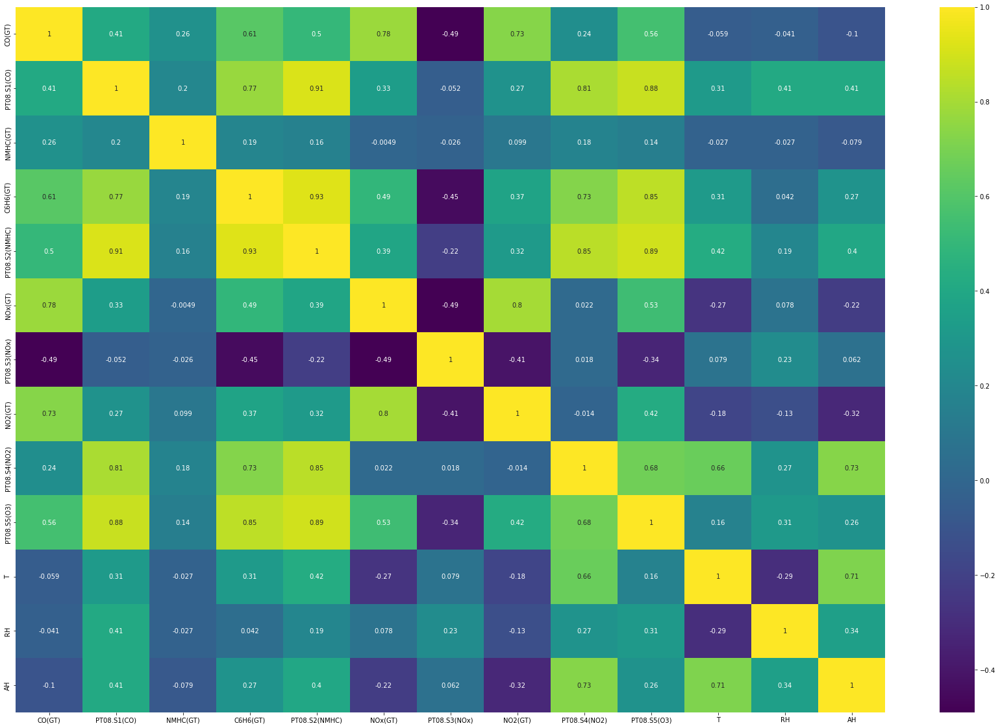

In [86]:
corrmat=new_Data_ati.corr()
top_corr_feature=corrmat.index
plt.figure(figsize=(30,20))
# to plot heat map
g=sns.heatmap(new_Data_ati[top_corr_feature].corr(),annot=True,cmap='viridis')

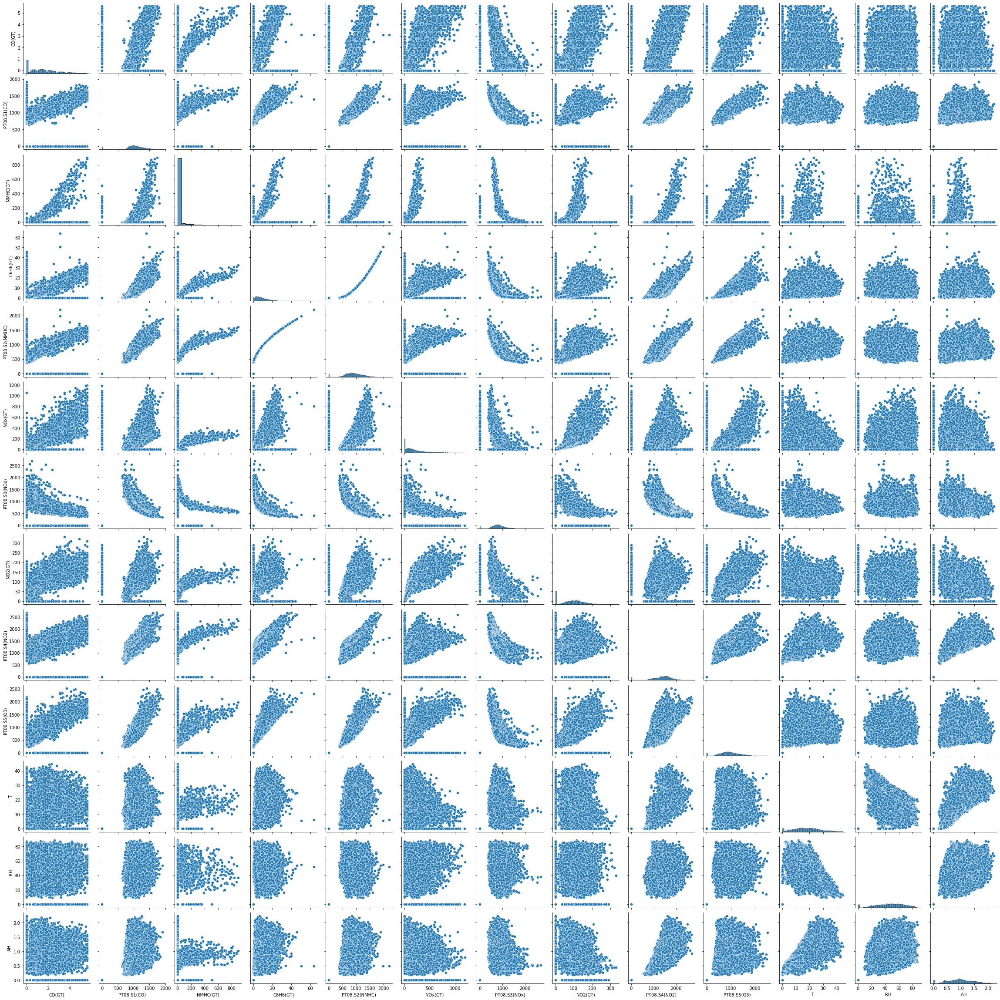

In [87]:
sns.pairplot(new_Data_ati)

In [94]:
prome_4 = []
X=new_Data_ati[['PT08.S1(CO)','C6H6(GT)','PT08.S2(NMHC)','NOx(GT)','NO2(GT)','PT08.S5(O3)']]
Y=new_Data_ati['CO(GT)']
model = LinearRegression()
for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, Y, train_size=0.5)
    model.fit(X = X_train, y = y_train)
    y_predict = model.predict(X = np.array(X_test))
    r2 = r2_score(y_true=y_test,y_pred=y_predict)
    prome_4.append(r2)

statistics.mean(prome_4)

0.7197120127286379

# Conclusion

The model with the highest accuracy achieved was with the data from **new_data_2**.